In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from skimage import data
from scipy.misc import imresize
from scipy.ndimage.filters import gaussian_filter
import IPython.display as ipyd
import tensorflow as tf
from libs import (utils, gif, datasets, dataset_utils, 
                  vae, dft, vgg16, nb_utils, inception, i2v)

In [2]:
net = inception.get_inception_model(version='v5')
# net = vgg16.get_vgg_model()
# net = vgg16.get_vgg_face_model()
# net = i2v.get_i2v_model()
# net = i2v.get_i2v_tag_model()

In [3]:
net.keys()

dict_keys(['graph_def', 'preprocess', 'labels', 'deprocess'])

(0.0, 1.0)

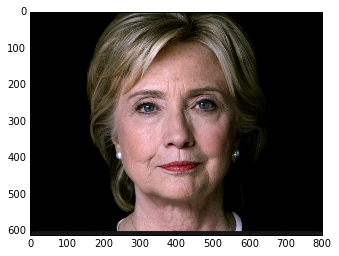

In [4]:
og = plt.imread('clinton.png')[..., :3]
plt.imshow(og)
og.min(), og.max()

In [5]:
img = net['preprocess'](og)
img.min(), img.max()

(-117.0, 138.0)

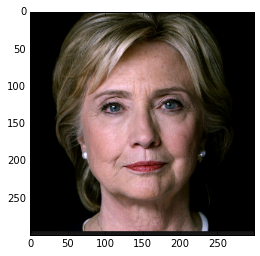

In [6]:
deprocessed = inception.deprocess(img)
plt.imshow(deprocessed)

In [7]:
tf.reset_default_graph()

In [8]:
height, width, n_channel = img.shape

In [9]:
input = tf.placeholder(tf.float32, img[np.newaxis].shape, 'input')
with tf.variable_scope('conv2d0'):
    with tf.variable_scope('pre_relu'):
        w = tf.get_variable('w', (n_channel, height, n_channel, width),
                            initializer=tf.random_normal_initializer(
                                            img.mean(), img.std()))
        h = tf.nn.conv2d(input, w, [1, 1, 1, 1], 'SAME')
        b = tf.get_variable('b', img.shape[0],
                            initializer=tf.constant_initializer())
        h = tf.nn.bias_add(h, b)
    h = tf.nn.relu(h)

In [10]:
nb_utils.show_graph(net['graph_def'])

In [11]:
net['labels']

['1girl',
 'solo',
 'long hair',
 'short hair',
 'blush',
 'breasts',
 'multiple girls',
 'smile',
 'blonde hair',
 'blue eyes',
 'brown hair',
 'open mouth',
 'hat',
 'thighhighs',
 'red eyes',
 'skirt',
 '2girls',
 'black hair',
 'ribbon',
 'twintails',
 'underwear',
 'school uniform',
 'brown eyes',
 'blue hair',
 '1boy',
 'monochrome',
 'panties',
 'dress',
 'green eyes',
 'gloves',
 'bow',
 'hair ornament',
 'animal ears',
 'looking at viewer',
 'nipples',
 'comic',
 'sitting',
 'weapon',
 'navel',
 'large breasts',
 'purple eyes',
 'cleavage',
 'pink hair',
 'purple hair',
 'closed eyes',
 'jewelry',
 'wings',
 'hair ribbon',
 'ponytail',
 'green hair',
 'simple background',
 'hair bow',
 'red hair',
 'tail',
 'yellow eyes',
 'very long hair',
 'nude',
 'glasses',
 'swimsuit',
 'ass',
 'flower',
 'bare shoulders',
 'silver hair',
 'hairband',
 'braid',
 'pantyhose',
 'boots',
 'censored',
 'detached sleeves',
 'black legwear',
 'one eye closed',
 'tears',
 'barefoot',
 'multiple 

In [12]:
label_i = 851
net['labels'][label_i]

(851, 'broom')

In [13]:
net = vgg16.get_vgg_model()
assert net['labels'][0] == (0, 'n01440764 tench, Tinca tinca')

In [14]:
device = '/cpu:0'
g = tf.Graph()
with tf.Session(graph=g), g.device(device):
    tf.import_graph_def(net['graph_def'], name='net')

In [15]:
names = [op.name for op in g.get_operations()]
names

['net/images',
 'net/mul/y',
 'net/mul',
 'net/split/split_dim',
 'net/split',
 'net/sub/y',
 'net/sub',
 'net/sub_1/y',
 'net/sub_1',
 'net/sub_2/y',
 'net/sub_2',
 'net/concat/concat_dim',
 'net/concat',
 'net/conv1_1/filter',
 'net/conv1_1/Conv2D',
 'net/conv1_1/biases',
 'net/conv1_1/BiasAdd',
 'net/conv1_1/conv1_1',
 'net/conv1_2/filter',
 'net/conv1_2/Conv2D',
 'net/conv1_2/biases',
 'net/conv1_2/BiasAdd',
 'net/conv1_2/conv1_2',
 'net/pool1',
 'net/conv2_1/filter',
 'net/conv2_1/Conv2D',
 'net/conv2_1/biases',
 'net/conv2_1/BiasAdd',
 'net/conv2_1/conv2_1',
 'net/conv2_2/filter',
 'net/conv2_2/Conv2D',
 'net/conv2_2/biases',
 'net/conv2_2/BiasAdd',
 'net/conv2_2/conv2_2',
 'net/pool2',
 'net/conv3_1/filter',
 'net/conv3_1/Conv2D',
 'net/conv3_1/biases',
 'net/conv3_1/BiasAdd',
 'net/conv3_1/conv3_1',
 'net/conv3_2/filter',
 'net/conv3_2/Conv2D',
 'net/conv3_2/biases',
 'net/conv3_2/BiasAdd',
 'net/conv3_2/conv3_2',
 'net/conv3_3/filter',
 'net/conv3_3/Conv2D',
 'net/conv3_3/bias

In [16]:
features = [op.name+':0' for op in g.get_operations() if 'pool' in op.name]
assert features == ['net/pool1:0', 'net/pool2:0', 'net/pool3:0', 'net/pool4:0', 'net/pool5:0']

In [17]:
x = g.get_tensor_by_name(names[0]+':0')
assert x.name == 'net/images:0'

In [18]:
def plot_gradient(img, x, feature, g, device=device):
    with tf.Session(graph=g) as sess, g.device(device):
        saliency = tf.gradients(tf.reduce_mean(feature), x)
        this_res = sess.run(saliency[0], feed_dict={x: img})
        grad = this_res[0] / np.max(np.abs(this_res))
        return grad

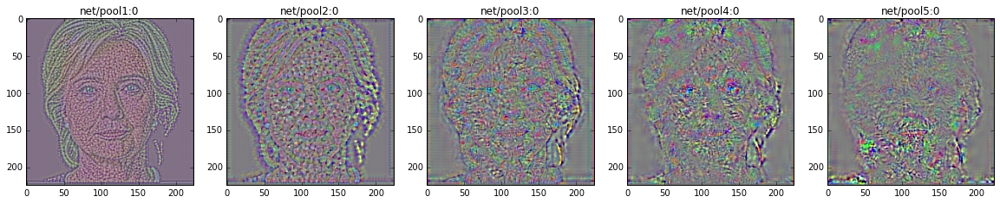

In [19]:
og = plt.imread('clinton.png')[..., :3]
img = net['preprocess'](og)[np.newaxis]

fig, axs = plt.subplots(1, len(features), figsize=(20, 10))

for i in range(len(features)):
    axs[i].set_title(features[i])
    grad = plot_gradient(img, x, g.get_tensor_by_name(features[i]), g)
    axs[i].imshow(utils.normalize(grad))

In [20]:
def dream(img, gradient, step, net, x, n_iterations=50, plot_step=10):
    img_copy = img.copy()
    fig, axs = plt.subplots(1, n_iterations // plot_step, figsize=(20, 10))
    with tf.Session(graph=g) as sess, g.device(device):
        for it_i in range(n_iterations):
            this_res = sess.run(gradient[0], feed_dict={x: img_copy})[0]
#             this_res /= (np.max(np.abs(this_res) + 1e-8))
            this_res /= (np.std(this_res) + 1e-8)
#             this_res = utils.normalize(this_res)
            img_copy += this_res * step
            if (it_i + 1) % plot_step == 0:
                m = net['deprocess'](img_copy[0])
                axs[it_i // plot_step].imshow(m)

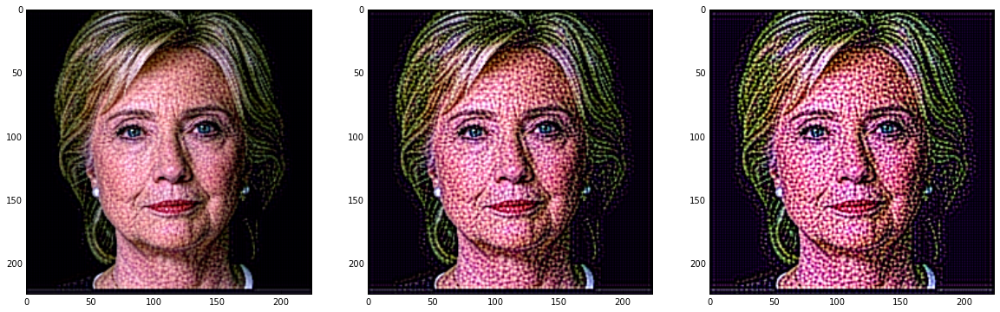

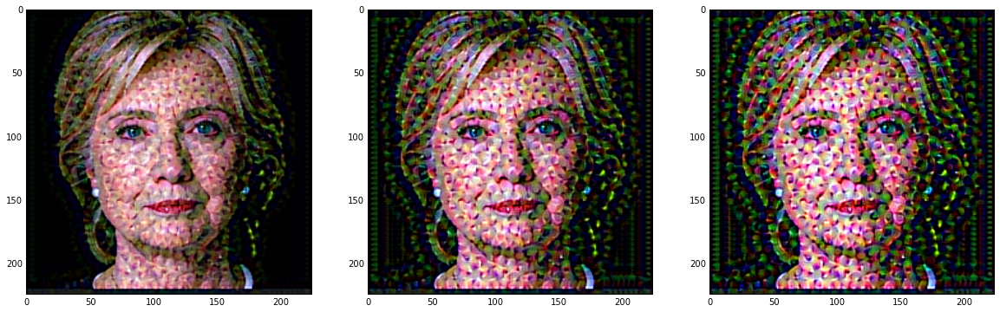

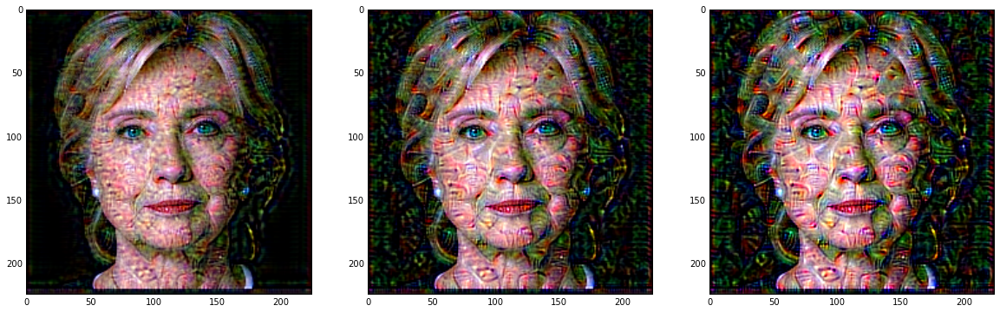

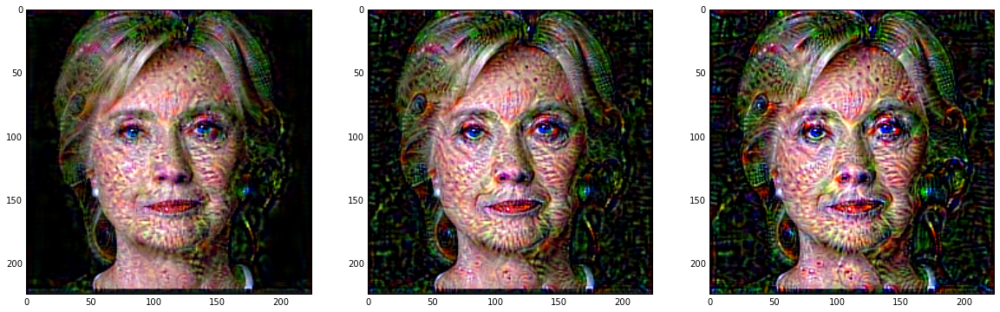

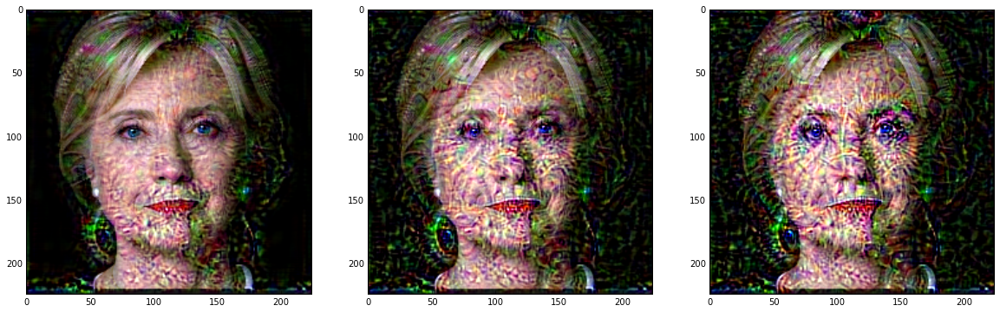

In [21]:
n_iterations = 3
step = .09
plot_step = 1

for feature_i in range(len(features)):
    with tf.Session(graph=g), g.device(device):
        layer = g.get_tensor_by_name(features[feature_i])
        gradient = tf.gradients(tf.reduce_mean(layer), x)
        dream(img, gradient, step, net, x, n_iterations=n_iterations, plot_step=plot_step)

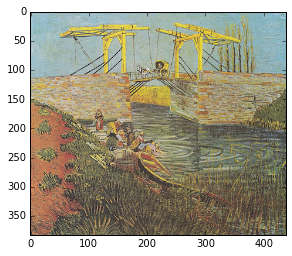

In [22]:
og = plt.imread('arles.png')
plt.imshow(og)

img = net['preprocess'](og)[np.newaxis][..., :3]

assert img.ndim == 4

In [23]:
layer = g.get_tensor_by_name(names[-2]+':0')
layer

<tf.Tensor 'net/prob:0' shape=(?, 1000) dtype=float32>

In [24]:
with tf.Session(graph=g), g.device(device):
    layer_shape = tf.shape(layer).eval(feed_dict={x: img})

n_els = layer_shape[-1]
layer_shape

array([   1, 1000], dtype=int32)

In [25]:
net['labels']

[(0, 'n01440764 tench, Tinca tinca'),
 (1, 'n01443537 goldfish, Carassius auratus'),
 (2,
  'n01484850 great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias'),
 (3, 'n01491361 tiger shark, Galeocerdo cuvieri'),
 (4, 'n01494475 hammerhead, hammerhead shark'),
 (5, 'n01496331 electric ray, crampfish, numbfish, torpedo'),
 (6, 'n01498041 stingray'),
 (7, 'n01514668 cock'),
 (8, 'n01514859 hen'),
 (9, 'n01518878 ostrich, Struthio camelus'),
 (10, 'n01530575 brambling, Fringilla montifringilla'),
 (11, 'n01531178 goldfinch, Carduelis carduelis'),
 (12, 'n01532829 house finch, linnet, Carpodacus mexicanus'),
 (13, 'n01534433 junco, snowbird'),
 (14, 'n01537544 indigo bunting, indigo finch, indigo bird, Passerina cyanea'),
 (15, 'n01558993 robin, American robin, Turdus migratorius'),
 (16, 'n01560419 bulbul'),
 (17, 'n01580077 jay'),
 (18, 'n01582220 magpie'),
 (19, 'n01592084 chickadee'),
 (20, 'n01601694 water ouzel, dipper'),
 (21, 'n01608432 kite'),
 (22, 'n0

In [26]:
neuron_i = np.random.randint(0, n_els)
assert neuron_i >=0 and neuron_i < n_els
net['labels'][neuron_i]

(698, 'n03877845 palace')

In [27]:
layer_vec = np.ones(layer_shape) / 100
layer_vec[..., neuron_i] = .99
layer_vec

array([[ 0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
         0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,  0.01,
      

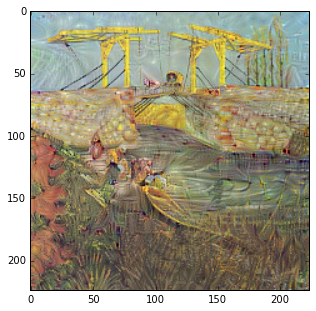

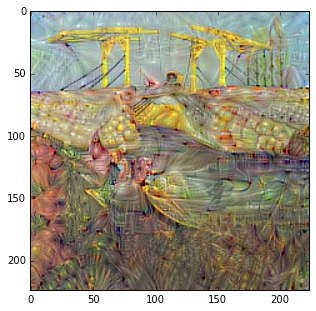

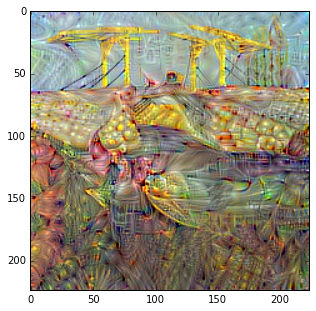

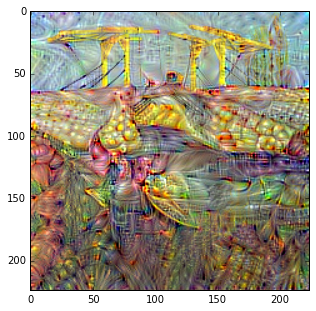

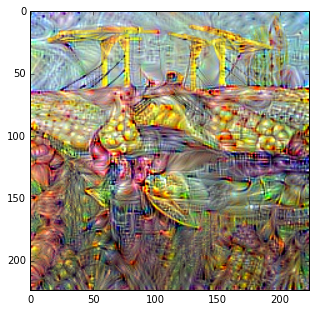

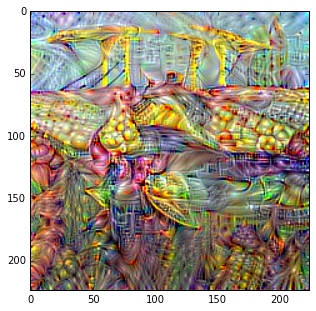

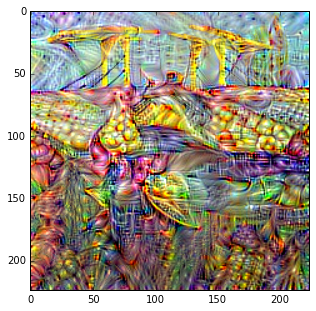

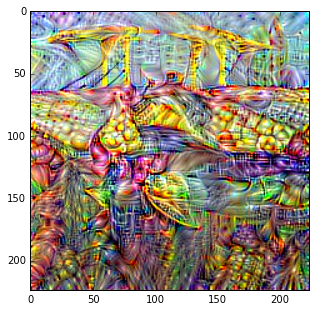

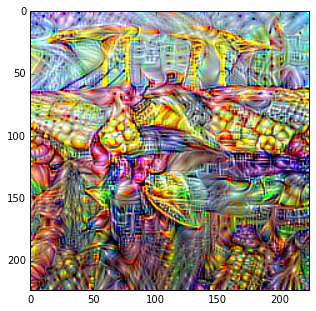

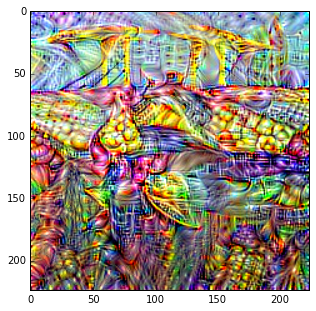

In [28]:
n_iterations = 200
plot_step = 20
step = .005

imgs = []
with tf.Session(graph=g), g.device(device):
    gradient = tf.gradients(tf.reduce_max(layer), x)
    img_copy = img.copy()
    with tf.Session(graph=g) as sess, g.device(device):
        for it_i in range(n_iterations):
            this_res = sess.run(gradient[0], feed_dict={
                    x:img_copy, layer: layer_vec
                })[0]
#             this_res /= (np.max(np.abs(this_res) + 1e-8))
            this_res /= (np.std(this_res) + 1e-8)
            img_copy += this_res * step
    
            if (it_i+1) % plot_step == 0:
                m = net['deprocess'](img_copy[0])
                plt.figure(figsize=(5, 5))
                plt.grid('off')
                plt.imshow(m)
                plt.show()
                imgs.append(m)

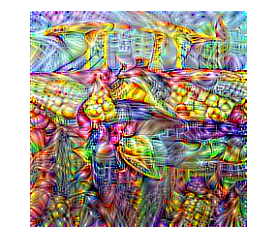

In [29]:
gif.build_gif(imgs, saveto='softmax.gif')

In [30]:
ipyd.Image(url='softmax.gif?i={}'.format(np.random.rand()), 
           height=300, width=300)

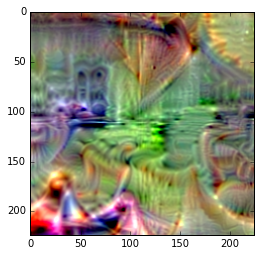

In [31]:
n_iterations = 200
plot_step = 20
step = .08
crop = 1
imgs = []

n_imgs, height, width, *ch = img.shape

with tf.Session(graph=g), g.device(device):
    gradient = tf.gradients(tf.reduce_max(layer), x)
    img_copy = img.copy()
    with tf.Session(graph=g) as sess, g.device(device):
        for it_i in range(n_iterations):
            this_res = sess.run(gradient[0], feed_dict={
                    x: img_copy, layer: layer_vec
                })[0]
            this_res = this_res / (np.max(np.abs(this_res)) + 1e-10)
#             this_res /= (np.std(this_res) + 1e-8)
            img_copy += this_res * step
            img_copy = img_copy[:, crop:-crop, crop:-crop, :]
            img_copy = resize(img_copy[0], (height, width), order=3,
                              clip=False, preserve_range=True
                             )[np.newaxis].astype(np.float32)
            
            if (it_i+1) % plot_step == 0:
                m = net['deprocess'](img_copy[0])
                
                plt.grid('off')
                plt.imshow(m)
                plt.show()
                
                imgs.append(m)

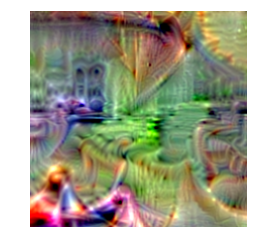

In [32]:
gif.build_gif(imgs, saveto='fractal.gif')
ipyd.Image(url='fractal.gif?i=2', height=300, width=300)

In [33]:
guide_og = plt.imread('../session-2/bebe.png')
dream_og = plt.imread('../session-2/jolies/0009.jpg')

assert guide_og.ndim == 3 and guide_og.shape[-1]
assert dream_og.ndim == 3 and dream_og.shape[-1]

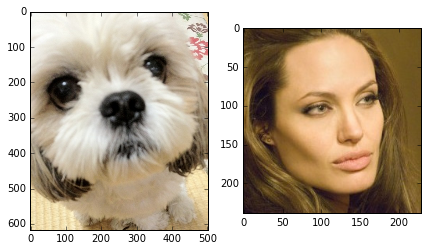

In [34]:
guide_img = net['preprocess'](guide_og)[np.newaxis]
dream_img = net['preprocess'](dream_og)[np.newaxis]

fig, axs = plt.subplots(1, 2, figsize=(7, 4))
axs[0].imshow(guide_og)
axs[1].imshow(dream_og)

In [35]:
x = g.get_tensor_by_name(names[0] + ':0')

feature_loss_weight = .7

with tf.Session(graph=g) as sess:
    feature_loss = tf.Variable(.0)
    for feature_i in features[3:5]:
        layer = g.get_tensor_by_name(feature_i)
        guide_layer = sess.run(layer, feed_dict={x: guide_img})
        layer = tf.reshape(layer, [-1, 1])
        guide_layer = guide_layer.reshape(-1, 1)
        correlation = tf.matmul(guide_layer.T, layer)
        feature_loss += feature_loss_weight * correlation

In [36]:
n_img, height, width, ch = dream_img.shape
tv_loss_weight = .8

with tf.Session(graph=g) as sess, g.device(device):
    dx = tf.square(x[:, :height-1, :width-1, :] - x[:, :height-1, 1:, :])
    dy = tf.square(x[:, :height-1, :width-1, :] - x[:, 1:, :width-1, :])
    tv_loss = tv_loss_weight * tf.reduce_mean(tf.pow(dx+dy, 1.2))

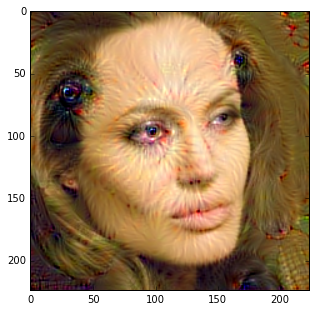

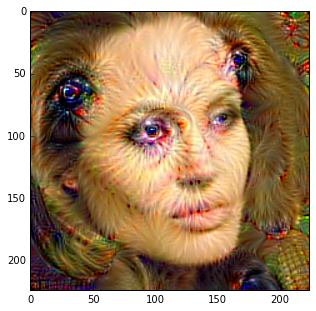

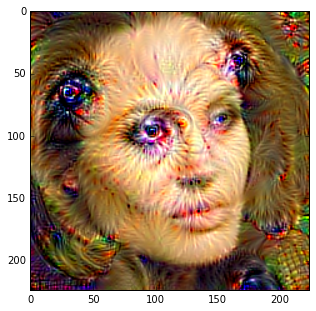

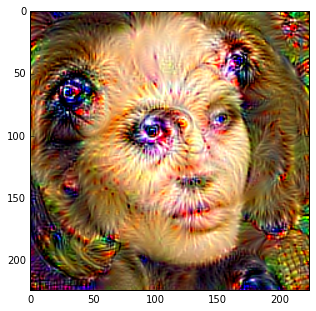

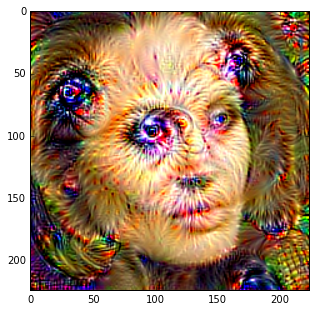

...

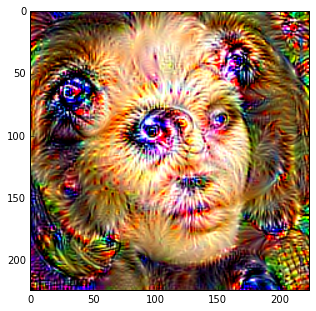

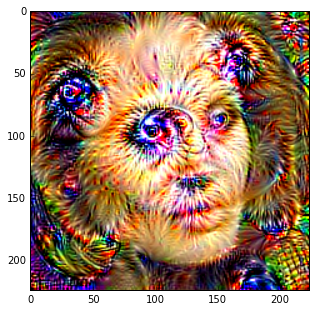

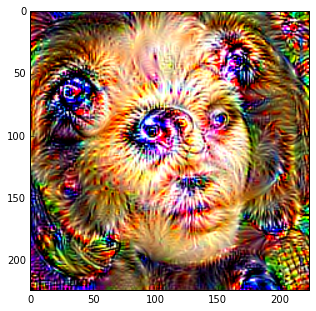

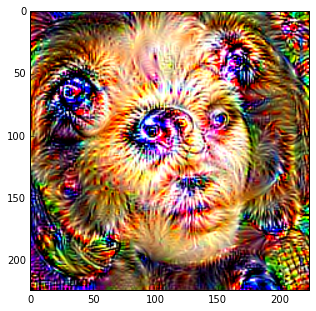

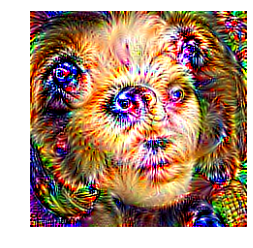

In [37]:
step = .1
imgs = []
with tf.Session(graph=g) as sess, g.device(device):
    gradient = tf.gradients(-tv_loss + feature_loss, x)
    img_copy = dream_img.copy()

    sess.run(tf.initialize_all_variables())
    for it_i in range(n_iterations):
        this_res = sess.run(gradient[0], feed_dict={x: img_copy})[0]
        this_res /= (np.max(np.abs(this_res) + 1e-8))
#         this_res /= (np.std(this_res) + 1e-8)
#         this_res = utils.normalize(this_res)
        img_copy += this_res * step

        if (it_i+1) % plot_step == 0:
            m = net['deprocess'](img_copy[0])

            plt.figure(figsize=(5, 5))
            plt.grid('off')
            plt.imshow(m)
            plt.show()

            imgs.append(m)

gif.build_gif(imgs, saveto='guided.gif')

In [38]:
ipyd.Image(url='guided.gif?i=0', height=300, width=300)

In [39]:
sess.close()
tf.reset_default_graph()

net = vgg16.get_vgg_model()
# net = vgg16.get_vgg_face_model()

In [40]:
device = '/cpu:0'
g = tf.Graph()

In [41]:
with tf.Session(graph=g), g.device(device):
    tf.import_graph_def(net['graph_def'], name='net')

In [42]:
names = [op.name for op in g.get_operations()]
names

['net/images',
 'net/mul/y',
 'net/mul',
 'net/split/split_dim',
 'net/split',
 'net/sub/y',
 'net/sub',
 'net/sub_1/y',
 'net/sub_1',
 'net/sub_2/y',
 'net/sub_2',
 'net/concat/concat_dim',
 'net/concat',
 'net/conv1_1/filter',
 'net/conv1_1/Conv2D',
 'net/conv1_1/biases',
 'net/conv1_1/BiasAdd',
 'net/conv1_1/conv1_1',
 'net/conv1_2/filter',
 'net/conv1_2/Conv2D',
 'net/conv1_2/biases',
 'net/conv1_2/BiasAdd',
 'net/conv1_2/conv1_2',
 'net/pool1',
 'net/conv2_1/filter',
 'net/conv2_1/Conv2D',
 'net/conv2_1/biases',
 'net/conv2_1/BiasAdd',
 'net/conv2_1/conv2_1',
 'net/conv2_2/filter',
 'net/conv2_2/Conv2D',
 'net/conv2_2/biases',
 'net/conv2_2/BiasAdd',
 'net/conv2_2/conv2_2',
 'net/pool2',
 'net/conv3_1/filter',
 'net/conv3_1/Conv2D',
 'net/conv3_1/biases',
 'net/conv3_1/BiasAdd',
 'net/conv3_1/conv3_1',
 'net/conv3_2/filter',
 'net/conv3_2/Conv2D',
 'net/conv3_2/biases',
 'net/conv3_2/BiasAdd',
 'net/conv3_2/conv3_2',
 'net/conv3_3/filter',
 'net/conv3_3/Conv2D',
 'net/conv3_3/bias

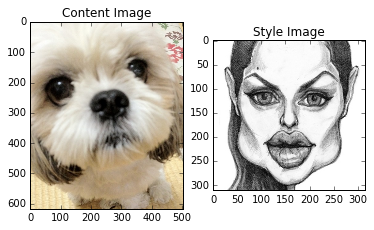

In [43]:
# content_og = plt.imread('arles.png')[..., :3]
# style_og = plt.imread('clinton.png')[..., :3]

content_og = plt.imread('../session-2/bebe.png')
style_og = plt.imread('../session-2/jolies/0079.jpg')

# content_og = plt.imread('../session-2/jolies/0079.jpg')
# style_og = plt.imread('arles.png')[..., :3]

fig, axs = plt.subplots(1, 2)
axs[0].imshow(content_og)
axs[0].set_title('Content Image')
axs[0].grid('off')
axs[1].imshow(style_og)
axs[1].set_title('Style Image')
axs[1].grid('off')

plt.imsave(arr=content_og, fname='content.png')
plt.imsave(arr=style_og, fname='style.png')

In [44]:
content_img = net['preprocess'](content_og)[np.newaxis]
style_img = net['preprocess'](style_og)[np.newaxis]

In [45]:
x = g.get_tensor_by_name(names[0]+':0')
softmax = g.get_tensor_by_name(names[-2]+':0')

for img in [content_img, style_img]:
    with tf.Session(graph=g), g.device(device):
        res = softmax.eval(feed_dict={
                x: img, 
                'net/dropout_1/random_uniform:0': [[1.]],
                'net/dropout/random_uniform:0': [[1.]]
            })[0]
        print([(res[idx], net['labels'][idx]) for idx in res.argsort()[-5:][::-1]])

[(0.6093924, (204, 'n02098413 Lhasa, Lhasa apso')), (0.39060298, (155, 'n02086240 Shih-Tzu')), (4.5663905e-06, (200, 'n02097474 Tibetan terrier, chrysanthemum dog')), (1.2339453e-07, (153, 'n02085936 Maltese dog, Maltese terrier, Maltese')), (1.2879971e-10, (154, 'n02086079 Pekinese, Pekingese, Peke'))]
[(0.99923503, (643, 'n03724870 mask')), (0.00075043959, (903, 'n04584207 wig')), (6.914725e-06, (921, 'n07248320 book jacket, dust cover, dust jacket, dust wrapper')), (2.4805163e-06, (838, 'n04357314 sunscreen, sunblock, sun blocker')), (2.4070437e-06, (841, 'n04370456 sweatshirt'))]


In [46]:
content_layer = 'net/conv3_2/conv3_2:0'

with tf.Session(graph=g) as sess, g.device(device):
    content_features = g.get_tensor_by_name(content_layer).eval(
        session=sess, feed_dict={
            x: content_img,
            'net/dropout_1/random_uniform:0': [[1.]],
            'net/dropout/random_uniform:0': [[1.]]
        })

In [47]:
style_layers = ['net/conv1_1/conv1_1:0',
                'net/conv2_1/conv2_1:0',
                'net/conv3_1/conv3_1:0',
                'net/conv4_1/conv4_1:0',
                'net/conv5_1/conv5_1:0']
style_activations = []

with tf.Session(graph=g), g.device('/cpu:0'):
    for style_i in style_layers:
        style_activation_i = g.get_tensor_by_name(style_i).eval(feed_dict={
                x: style_img,
                'net/dropout_1/random_uniform:0': [[1.]],
                'net/dropout/random_uniform:0': [[1.]]
            })
        style_activations.append(style_activation_i)

In [48]:
style_features = []
for style_activation_i in style_activations:
    s_i = np.reshape(style_activation_i, [-1, style_activation_i.shape[-1]])
    gram_matrix = np.matmul(s_i.T, s_i) / s_i.size
    style_features.append(gram_matrix.astype(np.float32))

In [49]:
tf.reset_default_graph()
g = tf.Graph()

# net = vgg16.get_vgg_model()

with tf.Session(graph=g), g.device(device):
#     net_input = tf.Variable(content_img / 255)
    net_input = tf.get_variable(
        name='input',
        shape=content_img.shape,
        dtype=tf.float32,
        initializer=tf.random_normal_initializer(
            mean=np.mean(content_img), stddev=np.std(content_img)))
    
    tf.import_graph_def(net['graph_def'], name='net',
                        input_map={
            'images:0': net_input,
#             'Placeholder:0': net_input,
        })

In [50]:
with tf.Session(graph=g), g.device(device):
    content_loss = tf.nn.l2_loss((g.get_tensor_by_name(content_layer) - 
                                  content_features) / content_features.size)

In [51]:
with tf.Session(graph=g), g.device(device):
    style_loss = np.float32(0)
    for style_layer_i, style_gram_i in zip(style_layers, style_features):
        layer_i = g.get_tensor_by_name(style_layer_i)
        layer_shape = layer_i.get_shape().as_list()
        layer_size = layer_shape[1] * layer_shape[2] * layer_shape[3]
        layer_flat = tf.reshape(layer_i, [-1, layer_shape[3]])
        gram_matrix = tf.matmul(tf.transpose(layer_flat), layer_flat) / layer_size
        style_loss = tf.add(style_loss, tf.nn.l2_loss((gram_matrix - style_gram_i) / 
                                                      np.float32(style_gram_i.size)))

In [52]:
def total_variation_loss(x):
    h, w = x.get_shape().as_list()[1], x.get_shape().as_list()[1]
    dx = tf.square(x[:, :h-1, :w-1, :] - x[:, :h-1, 1:, :])
    dy = tf.square(x[:, :h-1, :w-1, :] - x[:, 1:, :w-1, :])
    return tf.reduce_sum(tf.pow(dx+dy, 1.25))

with tf.Session(graph=g), g.device(device):
    tv_loss = total_variation_loss(net_input)

In [53]:
with tf.Session(graph=g), g.device(device):
    loss = 5 * content_loss + 1. * style_loss + .001 * tv_loss
    optimizer = tf.train.AdamOptimizer(.05).minimize(loss)

0: 43.654937744140625, (-0.48800766468048096 - 1.6334571838378906)


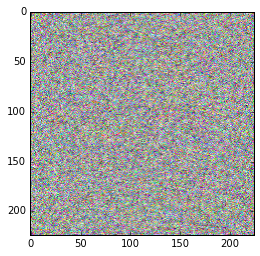

1: 26.98761749267578, (-0.43996816873550415 - 1.5835890769958496)
2: 19.584388732910156, (-0.393878698348999 - 1.5342005491256714)
3: 14.906003952026367, (-0.3496290147304535 - 1.4856972694396973)
4: 11.61368179321289, (-0.30717283487319946 - 1.4381935596466064)
5: 9.337726593017578, (-0.26645010709762573 - 1.3917999267578125)
6: 7.86262845993042, (-0.22737014293670654 - 1.346570372581482)
7: 6.967782974243164, (-0.1899038553237915 - 1.3052289485931396)
8: 6.42219877243042, (-0.1538560837507248 - 1.2687292098999023)
9: 6.043558120727539, (-0.11925120651721954 - 1.233097791671753)
10: 5.734274864196777, (-0.08605045825242996 - 1.1984648704528809)
11: 5.467361927032471, (-0.05429752543568611 - 1.170583963394165)
12: 5.239007949829102, (-0.04465140029788017 - 1.1768931150436401)
13: 5.041069984436035, (-0.04619419202208519 - 1.1794562339782715)
14: 4.859808921813965, (-0.04583181068301201 - 1.178905725479126)
15: 4.680854797363281, (-0.04515722766518593 - 1.1752837896347046)


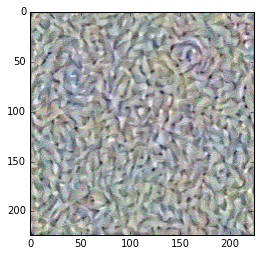

16: 4.498452663421631, (-0.044559746980667114 - 1.1682409048080444)
17: 4.3146281242370605, (-0.06644180417060852 - 1.157606840133667)
18: 4.134223937988281, (-0.0858188346028328 - 1.150970220565796)
19: 3.9619078636169434, (-0.09851256012916565 - 1.1595540046691895)
20: 3.7990100383758545, (-0.10387734323740005 - 1.176208257675171)
21: 3.644597053527832, (-0.1019909605383873 - 1.1971819400787354)
22: 3.498089075088501, (-0.0939415842294693 - 1.2220516204833984)
23: 3.3604884147644043, (-0.09479615092277527 - 1.243196725845337)
24: 3.2338662147521973, (-0.11008302122354507 - 1.260725498199463)
25: 3.119433879852295, (-0.1215595155954361 - 1.275496244430542)
26: 3.016772747039795, (-0.1291225254535675 - 1.2887898683547974)
27: 2.923623561859131, (-0.1325390785932541 - 1.3014113903045654)
28: 2.8379228115081787, (-0.1323845088481903 - 1.314371943473816)
29: 2.758761405944824, (-0.12813402712345123 - 1.3277379274368286)
30: 2.6859984397888184, (-0.12020368874073029 - 1.3428168296813965)


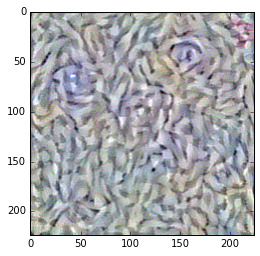

31: 2.6190340518951416, (-0.11763941496610641 - 1.361518144607544)
32: 2.55662202835083, (-0.12458554655313492 - 1.3786303997039795)
33: 2.49776029586792, (-0.12786808609962463 - 1.3938487768173218)
34: 2.44223952293396, (-0.12781229615211487 - 1.4070793390274048)
35: 2.3901584148406982, (-0.12582817673683167 - 1.4185808897018433)
36: 2.3418543338775635, (-0.12305758148431778 - 1.4286082983016968)
37: 2.29728102684021, (-0.11984409391880035 - 1.4378235340118408)
38: 2.2559869289398193, (-0.11664518713951111 - 1.448209285736084)
39: 2.217406749725342, (-0.11346419900655746 - 1.4606174230575562)
40: 2.1811914443969727, (-0.10992403328418732 - 1.4711036682128906)
41: 2.147139310836792, (-0.10589998215436935 - 1.4790211915969849)
42: 2.1149303913116455, (-0.10100385546684265 - 1.4837961196899414)
43: 2.084372043609619, (-0.09438154101371765 - 1.4849964380264282)
44: 2.055255889892578, (-0.10026073455810547 - 1.4830381870269775)
45: 2.027472972869873, (-0.1066882312297821 - 1.48091483116149

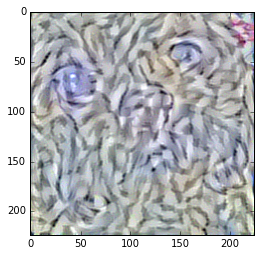

46: 2.0010149478912354, (-0.11055874824523926 - 1.4812874794006348)
47: 1.9760679006576538, (-0.1123335212469101 - 1.4811391830444336)
48: 1.95255708694458, (-0.11204224079847336 - 1.4805275201797485)
49: 1.9302661418914795, (-0.11099021881818771 - 1.4795246124267578)
50: 1.9090763330459595, (-0.1094924658536911 - 1.4781821966171265)
51: 1.888939619064331, (-0.10798149555921555 - 1.4764868021011353)
52: 1.869743824005127, (-0.10562515258789062 - 1.474439024925232)
53: 1.8513888120651245, (-0.10218339413404465 - 1.4721759557724)
54: 1.8338478803634644, (-0.09801285713911057 - 1.4714865684509277)
55: 1.81708562374115, (-0.09340807795524597 - 1.470658779144287)
56: 1.8009223937988281, (-0.08805941790342331 - 1.4698493480682373)
57: 1.78537917137146, (-0.0821249708533287 - 1.469104528427124)
58: 1.7704174518585205, (-0.08165640383958817 - 1.4685149192810059)
59: 1.7559864521026611, (-0.082961305975914 - 1.4697391986846924)
60: 1.7421274185180664, (-0.08418083935976028 - 1.4733097553253174)

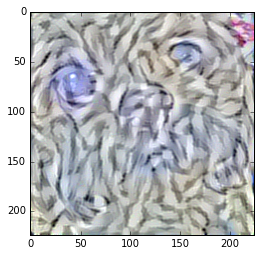

61: 1.7287509441375732, (-0.0853782445192337 - 1.4779205322265625)
62: 1.7158219814300537, (-0.08609599620103836 - 1.4832615852355957)
63: 1.7032579183578491, (-0.0851638913154602 - 1.4888849258422852)
64: 1.6910152435302734, (-0.08298008143901825 - 1.494730830192566)
65: 1.6791762113571167, (-0.0814882218837738 - 1.5008715391159058)
66: 1.6677134037017822, (-0.09469934552907944 - 1.5072388648986816)
67: 1.6565721035003662, (-0.10663381218910217 - 1.5138099193572998)
68: 1.6456990242004395, (-0.11729065328836441 - 1.5204352140426636)
69: 1.6351195573806763, (-0.12667761743068695 - 1.5268620252609253)
70: 1.6248424053192139, (-0.13468416035175323 - 1.532999038696289)
71: 1.6148412227630615, (-0.14121398329734802 - 1.5389094352722168)
72: 1.6050257682800293, (-0.1458146721124649 - 1.5448031425476074)
73: 1.595371961593628, (-0.148812398314476 - 1.5506622791290283)
74: 1.585883378982544, (-0.15065668523311615 - 1.5567383766174316)
75: 1.5765984058380127, (-0.15133780241012573 - 1.56289422

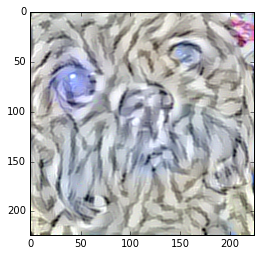

76: 1.5674364566802979, (-0.151270791888237 - 1.568960189819336)
77: 1.5584352016448975, (-0.15307332575321198 - 1.5746606588363647)
78: 1.5496737957000732, (-0.1544092297554016 - 1.579929232597351)
79: 1.5410407781600952, (-0.15503354370594025 - 1.5847225189208984)
80: 1.5325273275375366, (-0.1551843136548996 - 1.5889196395874023)
81: 1.5241782665252686, (-0.15499836206436157 - 1.5924289226531982)
82: 1.5159704685211182, (-0.15418288111686707 - 1.5952770709991455)
83: 1.5078535079956055, (-0.15272381901741028 - 1.5975273847579956)
84: 1.4998812675476074, (-0.15102675557136536 - 1.5990617275238037)
85: 1.4920933246612549, (-0.1525079905986786 - 1.6000330448150635)
86: 1.4845026731491089, (-0.154312402009964 - 1.6004287004470825)
87: 1.4770699739456177, (-0.15578140318393707 - 1.6002944707870483)
88: 1.4697847366333008, (-0.15688824653625488 - 1.5997827053070068)
89: 1.4626495838165283, (-0.15705427527427673 - 1.598994493484497)
90: 1.4555647373199463, (-0.15628942847251892 - 1.59799003

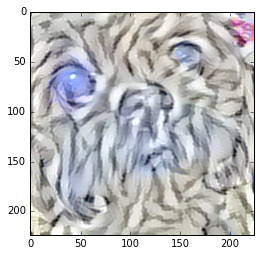

91: 1.4485797882080078, (-0.15532034635543823 - 1.5969871282577515)
92: 1.4417307376861572, (-0.15438109636306763 - 1.5960261821746826)
93: 1.434982419013977, (-0.15318790078163147 - 1.5950418710708618)
94: 1.4283634424209595, (-0.15172886848449707 - 1.5938242673873901)
95: 1.4218868017196655, (-0.1500319093465805 - 1.5924822092056274)
96: 1.4155726432800293, (-0.1477711796760559 - 1.5911115407943726)
97: 1.409355640411377, (-0.14535966515541077 - 1.5893901586532593)
98: 1.403210163116455, (-0.14271752536296844 - 1.587602972984314)
99: 1.3971456289291382, (-0.14003399014472961 - 1.5859107971191406)
100: 1.3911192417144775, (-0.13779956102371216 - 1.5841151475906372)
101: 1.385186791419983, (-0.13569965958595276 - 1.5823416709899902)
102: 1.379400372505188, (-0.13387669622898102 - 1.5805143117904663)
103: 1.3737409114837646, (-0.13237610459327698 - 1.5787378549575806)
104: 1.3681714534759521, (-0.13125434517860413 - 1.5768992900848389)
105: 1.3626983165740967, (-0.13045962154865265 - 1.

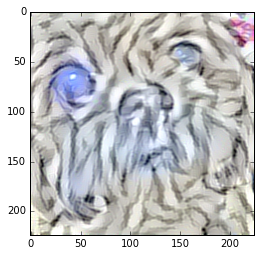

106: 1.357308268547058, (-0.13069351017475128 - 1.572090983390808)
107: 1.3519794940948486, (-0.13151726126670837 - 1.5692017078399658)
108: 1.3467270135879517, (-0.13210734724998474 - 1.5660680532455444)
109: 1.3415586948394775, (-0.13282985985279083 - 1.5629914999008179)
110: 1.3364627361297607, (-0.1335294097661972 - 1.5597410202026367)
111: 1.331405520439148, (-0.1342771053314209 - 1.5564337968826294)
112: 1.3264437913894653, (-0.13523231446743011 - 1.552862286567688)
113: 1.3215301036834717, (-0.1358000636100769 - 1.549094796180725)
114: 1.3166974782943726, (-0.13580960035324097 - 1.5454672574996948)
115: 1.3119064569473267, (-0.13537873327732086 - 1.5419310331344604)
116: 1.307175636291504, (-0.13410678505897522 - 1.538761854171753)
117: 1.302528977394104, (-0.1320619136095047 - 1.5357451438903809)
118: 1.297935962677002, (-0.1293756067752838 - 1.5329208374023438)
119: 1.2933757305145264, (-0.1263420581817627 - 1.530219554901123)
120: 1.2888596057891846, (-0.12394281476736069 - 1

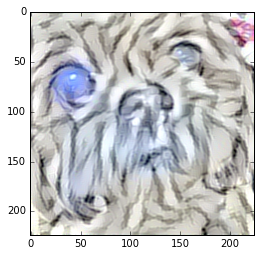

121: 1.2843868732452393, (-0.12225260585546494 - 1.5251420736312866)
122: 1.2799655199050903, (-0.12336000800132751 - 1.5227234363555908)
123: 1.2755762338638306, (-0.12535004317760468 - 1.5204154253005981)
124: 1.2712703943252563, (-0.1268092840909958 - 1.5182257890701294)
125: 1.2670179605484009, (-0.12784627079963684 - 1.516330361366272)
126: 1.262795090675354, (-0.12824666500091553 - 1.514539122581482)
127: 1.258605718612671, (-0.12817257642745972 - 1.5127387046813965)
128: 1.254465103149414, (-0.1280984729528427 - 1.5108563899993896)
129: 1.2503633499145508, (-0.12805823981761932 - 1.5088485479354858)
130: 1.2463279962539673, (-0.12811754643917084 - 1.5066840648651123)
131: 1.2423070669174194, (-0.12830406427383423 - 1.5046257972717285)
132: 1.2383195161819458, (-0.1285916566848755 - 1.502498745918274)
133: 1.2343283891677856, (-0.1288406401872635 - 1.5003745555877686)
134: 1.2303932905197144, (-0.12923826277256012 - 1.4981516599655151)
135: 1.2264798879623413, (-0.129811555147171

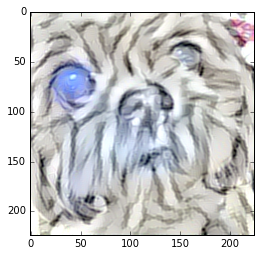

136: 1.2226253747940063, (-0.13041765987873077 - 1.494307518005371)
137: 1.2187973260879517, (-0.1310691237449646 - 1.4925298690795898)
138: 1.215032696723938, (-0.13349683582782745 - 1.4907540082931519)
139: 1.211279034614563, (-0.135866180062294 - 1.4890005588531494)
140: 1.2075804471969604, (-0.13850563764572144 - 1.4871628284454346)
141: 1.2038854360580444, (-0.1411820948123932 - 1.4850716590881348)
142: 1.2002174854278564, (-0.1436467468738556 - 1.4827059507369995)
143: 1.1966159343719482, (-0.14587320387363434 - 1.4799737930297852)
144: 1.1930094957351685, (-0.1474912464618683 - 1.477068305015564)
145: 1.1894809007644653, (-0.14811159670352936 - 1.4740387201309204)
146: 1.1860008239746094, (-0.1492694914340973 - 1.471119999885559)
147: 1.182539939880371, (-0.15069161355495453 - 1.4685423374176025)
148: 1.1791281700134277, (-0.15230272710323334 - 1.4663523435592651)
149: 1.1757179498672485, (-0.15386736392974854 - 1.4644068479537964)
150: 1.1723477840423584, (-0.15435506403446198 

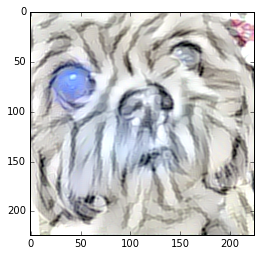

151: 1.1689969301223755, (-0.15356001257896423 - 1.4609192609786987)
152: 1.1656734943389893, (-0.15238747000694275 - 1.4594331979751587)
153: 1.1623460054397583, (-0.15143446624279022 - 1.458283543586731)
154: 1.1590838432312012, (-0.1506841629743576 - 1.4572032690048218)
155: 1.1558308601379395, (-0.15053746104240417 - 1.4562891721725464)
156: 1.1526305675506592, (-0.14933723211288452 - 1.4555460214614868)
157: 1.1494741439819336, (-0.1474200040102005 - 1.454779028892517)
158: 1.1463403701782227, (-0.14859290421009064 - 1.4541703462600708)
159: 1.1432371139526367, (-0.15353165566921234 - 1.453722357749939)
160: 1.1401718854904175, (-0.15705618262290955 - 1.4532912969589233)
161: 1.137132167816162, (-0.15958018600940704 - 1.4527742862701416)
162: 1.1341323852539062, (-0.16133680939674377 - 1.4522483348846436)
163: 1.1311670541763306, (-0.16239586472511292 - 1.4516841173171997)
164: 1.1282122135162354, (-0.16308556497097015 - 1.4509669542312622)
165: 1.1252665519714355, (-0.16322612762

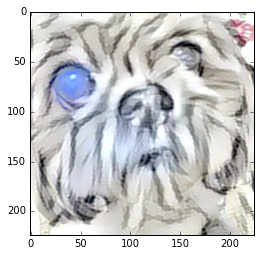

166: 1.1223455667495728, (-0.16314615309238434 - 1.448996901512146)
167: 1.119462013244629, (-0.16295264661312103 - 1.4478472471237183)
168: 1.1165919303894043, (-0.16202792525291443 - 1.4466824531555176)
169: 1.1137508153915405, (-0.16058635711669922 - 1.4455457925796509)
170: 1.1109437942504883, (-0.15996842086315155 - 1.4444384574890137)
171: 1.108163833618164, (-0.1604093462228775 - 1.443346381187439)
172: 1.1053887605667114, (-0.16054801642894745 - 1.442122220993042)
173: 1.1026359796524048, (-0.15999573469161987 - 1.4408848285675049)
174: 1.0998790264129639, (-0.1583605706691742 - 1.4396873712539673)
175: 1.0971453189849854, (-0.15643614530563354 - 1.4382437467575073)
176: 1.0944284200668335, (-0.1533864140510559 - 1.4366345405578613)
177: 1.0917237997055054, (-0.148837611079216 - 1.4348376989364624)
178: 1.0890262126922607, (-0.14416277408599854 - 1.4329737424850464)
179: 1.0863664150238037, (-0.14048384130001068 - 1.4311103820800781)
180: 1.0837454795837402, (-0.165126308798789

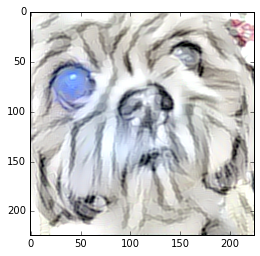

181: 1.081134557723999, (-0.1946111023426056 - 1.4277019500732422)
182: 1.0785393714904785, (-0.22444315254688263 - 1.4261329174041748)
183: 1.0759501457214355, (-0.254793256521225 - 1.4245314598083496)
184: 1.073375940322876, (-0.28562918305397034 - 1.4228767156600952)
185: 1.0708494186401367, (-0.3176575005054474 - 1.4212638139724731)
186: 1.0682861804962158, (-0.35114365816116333 - 1.4197317361831665)
187: 1.0657658576965332, (-0.3860485553741455 - 1.4181667566299438)
188: 1.0632493495941162, (-0.42172446846961975 - 1.4167451858520508)
189: 1.0607495307922363, (-0.4581979811191559 - 1.415440559387207)
190: 1.0582488775253296, (-0.49551627039909363 - 1.4141387939453125)
191: 1.0557656288146973, (-0.533768355846405 - 1.4127851724624634)
192: 1.0533027648925781, (-0.5730001330375671 - 1.4115456342697144)
193: 1.050869345664978, (-0.6128072738647461 - 1.4105618000030518)
194: 1.0484850406646729, (-0.6527751684188843 - 1.4097739458084106)
195: 1.046098232269287, (-0.6926684379577637 - 1.

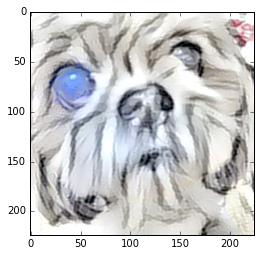

196: 1.0437344312667847, (-0.7325921058654785 - 1.408836007118225)
197: 1.0413777828216553, (-0.7726766467094421 - 1.4086745977401733)
198: 1.0390729904174805, (-0.8125585317611694 - 1.4084386825561523)
199: 1.0367708206176758, (-0.8523802161216736 - 1.4080644845962524)
200: 1.0344876050949097, (-0.8918014168739319 - 1.4077016115188599)
201: 1.0322091579437256, (-0.9303814768791199 - 1.4073004722595215)
202: 1.0299513339996338, (-0.9679295420646667 - 1.4067683219909668)
203: 1.0276906490325928, (-1.004547357559204 - 1.4064357280731201)
204: 1.0254571437835693, (-1.0399866104125977 - 1.406324028968811)
205: 1.0232149362564087, (-1.0743257999420166 - 1.4064055681228638)
206: 1.02100670337677, (-1.107661485671997 - 1.4069124460220337)
207: 1.0188080072402954, (-1.1396428346633911 - 1.407901644706726)
208: 1.0166088342666626, (-1.1700149774551392 - 1.4092947244644165)
209: 1.0144236087799072, (-1.1988359689712524 - 1.4107351303100586)
210: 1.012256145477295, (-1.2266933917999268 - 1.412058

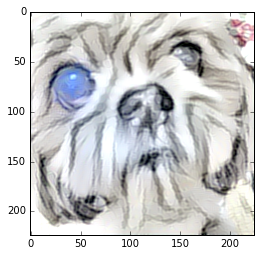

211: 1.0101042985916138, (-1.2536633014678955 - 1.4132742881774902)
212: 1.0079339742660522, (-1.2800716161727905 - 1.4144734144210815)
213: 1.0058033466339111, (-1.3053745031356812 - 1.4154832363128662)
214: 1.003654956817627, (-1.329556941986084 - 1.416206955909729)
215: 1.0015113353729248, (-1.3524945974349976 - 1.4164267778396606)
216: 0.9993324875831604, (-1.373921275138855 - 1.416295051574707)
217: 0.9971699714660645, (-1.3937351703643799 - 1.415869951248169)
218: 0.9949985146522522, (-1.4119348526000977 - 1.4152458906173706)
219: 0.992823600769043, (-1.4286818504333496 - 1.4145618677139282)
220: 0.9906543493270874, (-1.443977952003479 - 1.4138925075531006)
221: 0.9884660840034485, (-1.4575518369674683 - 1.4130903482437134)
222: 0.9862692952156067, (-1.4694188833236694 - 1.412148118019104)
223: 0.9840773344039917, (-1.4795926809310913 - 1.4111628532409668)
224: 0.9818958044052124, (-1.4880352020263672 - 1.4100008010864258)
225: 0.9797369241714478, (-1.4949605464935303 - 1.4086977

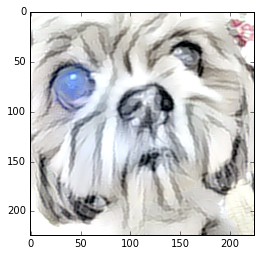

226: 0.9775711297988892, (-1.5009125471115112 - 1.4073169231414795)
227: 0.9754021167755127, (-1.505954384803772 - 1.405927300453186)
228: 0.9732418656349182, (-1.5099974870681763 - 1.4045647382736206)
229: 0.9711042046546936, (-1.5132642984390259 - 1.4031563997268677)
230: 0.968971848487854, (-1.5152747631072998 - 1.4019248485565186)
231: 0.9668369293212891, (-1.5159471035003662 - 1.400894045829773)
232: 0.9647089242935181, (-1.5146961212158203 - 1.399977684020996)
233: 0.9625758528709412, (-1.5123108625411987 - 1.3993746042251587)
234: 0.9604770541191101, (-1.5088335275650024 - 1.3989791870117188)
235: 0.9584348201751709, (-1.5045918226242065 - 1.3985936641693115)
236: 0.9564117193222046, (-1.500387191772461 - 1.3982194662094116)
237: 0.9544730186462402, (-1.4951823949813843 - 1.3979239463806152)
238: 0.9525595903396606, (-1.4887816905975342 - 1.3977910280227661)
239: 0.950656533241272, (-1.4811667203903198 - 1.3979506492614746)
240: 0.9487868547439575, (-1.4724771976470947 - 1.39831

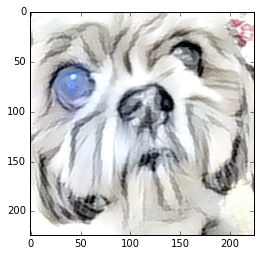

241: 0.9469926953315735, (-1.4630452394485474 - 1.3987349271774292)
242: 0.9452277421951294, (-1.4524800777435303 - 1.3990707397460938)
243: 0.943501353263855, (-1.4412579536437988 - 1.3993072509765625)
244: 0.9417952299118042, (-1.4292033910751343 - 1.3991432189941406)
245: 0.9400902390480042, (-1.4170231819152832 - 1.3986469507217407)
246: 0.938378095626831, (-1.404528021812439 - 1.3978255987167358)
247: 0.9366917610168457, (-1.3910143375396729 - 1.3967257738113403)
248: 0.9350264072418213, (-1.3766860961914062 - 1.3952035903930664)
249: 0.9334007501602173, (-1.361526370048523 - 1.3931928873062134)
250: 0.9317470192909241, (-1.346211552619934 - 1.3908954858779907)
251: 0.9300978183746338, (-1.3307744264602661 - 1.3884224891662598)
252: 0.9284694790840149, (-1.3149869441986084 - 1.3861197233200073)
253: 0.9268732070922852, (-1.2988008260726929 - 1.3840044736862183)
254: 0.9252983331680298, (-1.2822544574737549 - 1.3822540044784546)
255: 0.9237244129180908, (-1.2651602029800415 - 1.380

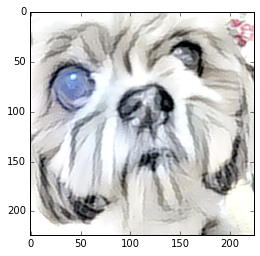

256: 0.9221611022949219, (-1.2472065687179565 - 1.3794879913330078)
257: 0.9205992221832275, (-1.2286158800125122 - 1.3782310485839844)
258: 0.919059157371521, (-1.2091612815856934 - 1.3769184350967407)
259: 0.9175231456756592, (-1.1895370483398438 - 1.3758959770202637)
260: 0.9159711599349976, (-1.1688709259033203 - 1.375035047531128)
261: 0.9144423007965088, (-1.1471394300460815 - 1.3740841150283813)
262: 0.9129241704940796, (-1.124449372291565 - 1.3731178045272827)
263: 0.9114108085632324, (-1.1009048223495483 - 1.3721661567687988)
264: 0.9099246263504028, (-1.0765925645828247 - 1.3708781003952026)
265: 0.9084309935569763, (-1.051615834236145 - 1.3692551851272583)
266: 0.906933069229126, (-1.0264315605163574 - 1.3674463033676147)
267: 0.9054654836654663, (-1.000638484954834 - 1.3654935359954834)
268: 0.9039742350578308, (-0.9741601943969727 - 1.3632076978683472)
269: 0.9024769067764282, (-0.9473676681518555 - 1.3606947660446167)
270: 0.901006817817688, (-0.92037034034729 - 1.3582183

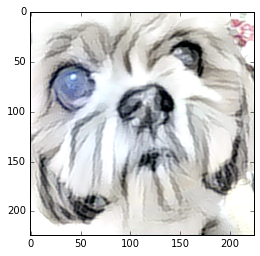

271: 0.899559497833252, (-0.8929896354675293 - 1.3558003902435303)
272: 0.8981029987335205, (-0.8652374744415283 - 1.3534940481185913)
273: 0.8966652154922485, (-0.8374258279800415 - 1.3515064716339111)
274: 0.8952329158782959, (-0.8150201439857483 - 1.3497917652130127)
275: 0.8938190340995789, (-0.7941630482673645 - 1.348191499710083)
276: 0.8924301862716675, (-0.7727978229522705 - 1.3465938568115234)
277: 0.8910510540008545, (-0.7511169910430908 - 1.3449894189834595)
278: 0.8896881341934204, (-0.7292272448539734 - 1.3435138463974)
279: 0.8883114457130432, (-0.7071520686149597 - 1.341957688331604)
280: 0.8869441747665405, (-0.6848005056381226 - 1.340268850326538)
281: 0.8855602741241455, (-0.6623137593269348 - 1.3384264707565308)
282: 0.8841729760169983, (-0.6398301124572754 - 1.3363525867462158)
283: 0.8828330039978027, (-0.6169203519821167 - 1.3340768814086914)
284: 0.8814842700958252, (-0.593662679195404 - 1.3317221403121948)
285: 0.8801662921905518, (-0.5701693892478943 - 1.329537

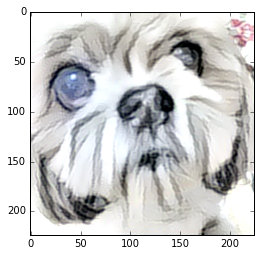

286: 0.8788812160491943, (-0.5460367202758789 - 1.327836513519287)
287: 0.8776775598526001, (-0.5213991403579712 - 1.3274595737457275)
288: 0.8764786720275879, (-0.4966760575771332 - 1.328075885772705)
289: 0.8753231763839722, (-0.4719422459602356 - 1.3296488523483276)
290: 0.8741680383682251, (-0.44690629839897156 - 1.3302642107009888)
291: 0.8730148673057556, (-0.4218197166919708 - 1.3299771547317505)
292: 0.8718539476394653, (-0.3963437080383301 - 1.3297425508499146)
293: 0.8707277774810791, (-0.37059667706489563 - 1.3299555778503418)
294: 0.8695904016494751, (-0.3444312810897827 - 1.3307567834854126)
295: 0.8684829473495483, (-0.31786516308784485 - 1.3320040702819824)
296: 0.867374062538147, (-0.29071423411369324 - 1.3337746858596802)
297: 0.8662838935852051, (-0.26321014761924744 - 1.3351430892944336)
298: 0.8652150630950928, (-0.24633891880512238 - 1.3352007865905762)
299: 0.8641413450241089, (-0.2469889223575592 - 1.3345246315002441)
300: 0.8630954027175903, (-0.2471764087677002

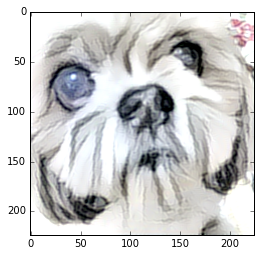

301: 0.8620641827583313, (-0.24760451912879944 - 1.3344401121139526)
302: 0.8610552549362183, (-0.2477835863828659 - 1.334726095199585)
303: 0.8600473403930664, (-0.24747446179389954 - 1.3349974155426025)
304: 0.8590415716171265, (-0.24660857021808624 - 1.335208535194397)
305: 0.8580498695373535, (-0.24597719311714172 - 1.3350443840026855)
306: 0.8570677638053894, (-0.24617233872413635 - 1.3348376750946045)
307: 0.8561065793037415, (-0.2460205852985382 - 1.3341941833496094)
308: 0.8551483154296875, (-0.24516591429710388 - 1.3333909511566162)
309: 0.8542006015777588, (-0.24459975957870483 - 1.3333097696304321)
310: 0.8532583713531494, (-0.24459892511367798 - 1.3331693410873413)
311: 0.8523387908935547, (-0.24553191661834717 - 1.3327207565307617)
312: 0.8514140844345093, (-0.24673084914684296 - 1.33182692527771)
313: 0.8505050539970398, (-0.24757450819015503 - 1.3311012983322144)
314: 0.8496168851852417, (-0.24789202213287354 - 1.330925464630127)
315: 0.848739504814148, (-0.2479697912931

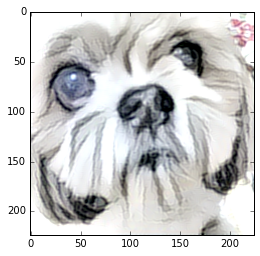

316: 0.8478648066520691, (-0.24760982394218445 - 1.331222653388977)
317: 0.8469958305358887, (-0.2484140396118164 - 1.331256628036499)
318: 0.8461335897445679, (-0.24956326186656952 - 1.331346035003662)
319: 0.8452907204627991, (-0.2501266300678253 - 1.3315154314041138)
320: 0.8444243669509888, (-0.2504396438598633 - 1.3309845924377441)
321: 0.843580961227417, (-0.2509288489818573 - 1.3305703401565552)
322: 0.842739999294281, (-0.2518764138221741 - 1.330509901046753)
323: 0.8419104814529419, (-0.25321999192237854 - 1.3308742046356201)
324: 0.8411045074462891, (-0.2544004023075104 - 1.331176996231079)
325: 0.840308427810669, (-0.25475451350212097 - 1.330843448638916)
326: 0.8395111560821533, (-0.254062294960022 - 1.3301817178726196)
327: 0.8387359976768494, (-0.25282707810401917 - 1.3291690349578857)
328: 0.8379440903663635, (-0.25111082196235657 - 1.3283565044403076)
329: 0.8371837735176086, (-0.2497122883796692 - 1.3279478549957275)
330: 0.8364337682723999, (-0.24862341582775116 - 1.3

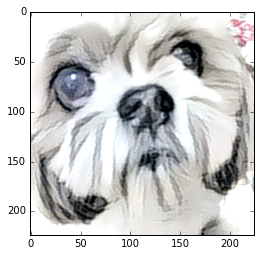

331: 0.8356869220733643, (-0.2470698058605194 - 1.3269174098968506)
332: 0.8349320888519287, (-0.24511747062206268 - 1.3263990879058838)
333: 0.8342069983482361, (-0.24302524328231812 - 1.325681209564209)
334: 0.8334733247756958, (-0.2420540302991867 - 1.324923038482666)
335: 0.8327676057815552, (-0.24204285442829132 - 1.323959231376648)
336: 0.8320540189743042, (-0.24233071506023407 - 1.3231111764907837)
337: 0.8313679695129395, (-0.24195906519889832 - 1.3223909139633179)
338: 0.8306735157966614, (-0.24147668480873108 - 1.3215833902359009)
339: 0.8299912214279175, (-0.2412089854478836 - 1.3208398818969727)
340: 0.8293322324752808, (-0.2417195737361908 - 1.3198862075805664)
341: 0.8286591172218323, (-0.24239321053028107 - 1.318777084350586)
342: 0.8280165791511536, (-0.24295975267887115 - 1.3176058530807495)
343: 0.8273563981056213, (-0.24306729435920715 - 1.3167035579681396)
344: 0.8267415761947632, (-0.24316443502902985 - 1.3161424398422241)
345: 0.8260735869407654, (-0.2437186092138

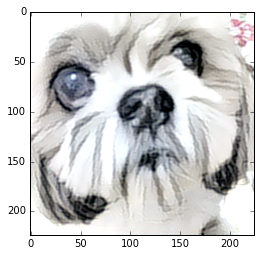

346: 0.8254519701004028, (-0.2445884644985199 - 1.315449595451355)
347: 0.8248085379600525, (-0.2451178878545761 - 1.3155568838119507)
348: 0.82417231798172, (-0.2450442910194397 - 1.3160539865493774)
349: 0.8235369920730591, (-0.2443898618221283 - 1.3159816265106201)
350: 0.822887659072876, (-0.2440979927778244 - 1.3149347305297852)
351: 0.8222500681877136, (-0.24403540790081024 - 1.3136565685272217)
352: 0.8216114044189453, (-0.24388718605041504 - 1.314449429512024)
353: 0.8209774494171143, (-0.24340973794460297 - 1.3153271675109863)
354: 0.8203381896018982, (-0.24339477717876434 - 1.3136696815490723)
355: 0.8197100162506104, (-0.2431970238685608 - 1.3105148077011108)
356: 0.8190664052963257, (-0.24289490282535553 - 1.309512734413147)
357: 0.8184612989425659, (-0.24243946373462677 - 1.3100595474243164)
358: 0.8178340196609497, (-0.2418663054704666 - 1.3095290660858154)
359: 0.8171931505203247, (-0.2413458526134491 - 1.3089423179626465)
360: 0.8165709972381592, (-0.24099434912204742 -

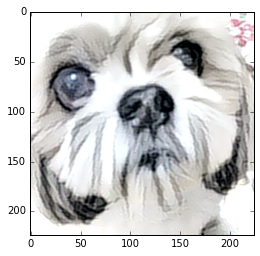

361: 0.8159472942352295, (-0.24111516773700714 - 1.3070467710494995)
362: 0.815305233001709, (-0.24158792197704315 - 1.3064311742782593)
363: 0.8146957159042358, (-0.242523655295372 - 1.306708574295044)
364: 0.8140512704849243, (-0.24322247505187988 - 1.306721568107605)
365: 0.813437283039093, (-0.24325604736804962 - 1.3077548742294312)
366: 0.8128081560134888, (-0.24299322068691254 - 1.3108144998550415)
367: 0.8122135400772095, (-0.24293072521686554 - 1.3114444017410278)
368: 0.8116254806518555, (-0.24313072860240936 - 1.3069109916687012)
369: 0.8110381364822388, (-0.2436896711587906 - 1.3046799898147583)
370: 0.8104573488235474, (-0.24429310858249664 - 1.304677963256836)
371: 0.809909462928772, (-0.24480850994586945 - 1.3046056032180786)
372: 0.8093386292457581, (-0.2450583577156067 - 1.3052812814712524)
373: 0.8088024854660034, (-0.24439279735088348 - 1.3059719800949097)
374: 0.8082400560379028, (-0.24355943500995636 - 1.3065149784088135)
375: 0.8077166080474854, (-0.242877528071403

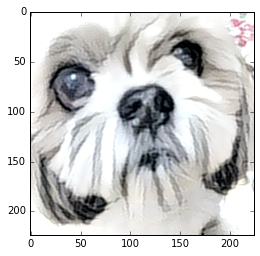

376: 0.807167649269104, (-0.2418982833623886 - 1.3048207759857178)
377: 0.8066442012786865, (-0.24058271944522858 - 1.3034292459487915)
378: 0.8061174154281616, (-0.2393222153186798 - 1.3027005195617676)
379: 0.805580735206604, (-0.23802931606769562 - 1.3021230697631836)
380: 0.805069625377655, (-0.2373834103345871 - 1.302649974822998)
381: 0.8045427799224854, (-0.23676006495952606 - 1.3017220497131348)
382: 0.8040270805358887, (-0.23618997633457184 - 1.3008631467819214)
383: 0.8035187721252441, (-0.23611018061637878 - 1.2995963096618652)
384: 0.8030083179473877, (-0.236369788646698 - 1.3006800413131714)
385: 0.8024899959564209, (-0.23657213151454926 - 1.3022732734680176)
386: 0.8019813299179077, (-0.23690256476402283 - 1.3016870021820068)
387: 0.8014718890190125, (-0.23725120723247528 - 1.3003119230270386)
388: 0.800959050655365, (-0.23730766773223877 - 1.3008347749710083)
389: 0.8004736304283142, (-0.23728005588054657 - 1.2993919849395752)
390: 0.7999669313430786, (-0.237573534250259

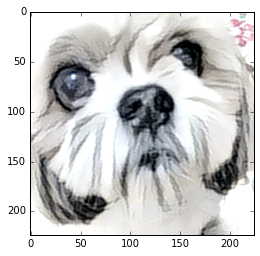

391: 0.7994952201843262, (-0.2379719465970993 - 1.2996697425842285)
392: 0.799013614654541, (-0.23783071339130402 - 1.301358699798584)
393: 0.7985239028930664, (-0.23727793991565704 - 1.3000766038894653)
394: 0.7980551719665527, (-0.23667725920677185 - 1.2970335483551025)
395: 0.7975895404815674, (-0.2352002114057541 - 1.2964571714401245)
396: 0.797128438949585, (-0.2328517735004425 - 1.296412467956543)
397: 0.7966687083244324, (-0.2307891547679901 - 1.2967242002487183)
398: 0.7961997985839844, (-0.23067493736743927 - 1.2967784404754639)
399: 0.7957535982131958, (-0.2304602563381195 - 1.2976140975952148)
400: 0.7953104972839355, (-0.23019252717494965 - 1.2997276782989502)
401: 0.7948576211929321, (-0.22980959713459015 - 1.2986795902252197)
402: 0.7944271564483643, (-0.22932569682598114 - 1.295966625213623)
403: 0.7939846515655518, (-0.22888478636741638 - 1.2933988571166992)
404: 0.7935595512390137, (-0.22890645265579224 - 1.2927676439285278)
405: 0.7931180000305176, (-0.229305386543273

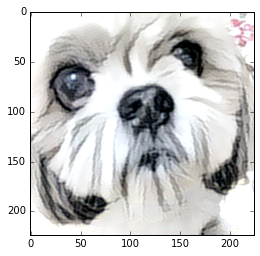

406: 0.7926881313323975, (-0.23025915026664734 - 1.294033408164978)
407: 0.7922759056091309, (-0.23120370507240295 - 1.2946372032165527)
408: 0.7918529510498047, (-0.23193417489528656 - 1.2941547632217407)
409: 0.7914426326751709, (-0.23265108466148376 - 1.2932685613632202)
410: 0.7910337448120117, (-0.23330378532409668 - 1.2930001020431519)
411: 0.7906134128570557, (-0.23384805023670197 - 1.2929006814956665)
412: 0.7902171015739441, (-0.2346230000257492 - 1.293067455291748)
413: 0.7898082733154297, (-0.2355421781539917 - 1.2928909063339233)
414: 0.7894203066825867, (-0.23649372160434723 - 1.2929489612579346)
415: 0.7890293002128601, (-0.23730702698230743 - 1.2935010194778442)
416: 0.78863126039505, (-0.23790352046489716 - 1.2945058345794678)
417: 0.7882322072982788, (-0.23818308115005493 - 1.2948954105377197)
418: 0.7878358364105225, (-0.23832522332668304 - 1.2949916124343872)
419: 0.7874425649642944, (-0.2382306158542633 - 1.2946380376815796)
420: 0.787041962146759, (-0.2380440086126

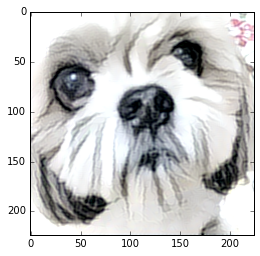

421: 0.7866722345352173, (-0.23774681985378265 - 1.2937040328979492)
422: 0.7862749099731445, (-0.2370787262916565 - 1.2935529947280884)
423: 0.7859212160110474, (-0.23608481884002686 - 1.2939093112945557)
424: 0.7855238318443298, (-0.2351406365633011 - 1.2940343618392944)
425: 0.7851756811141968, (-0.23418372869491577 - 1.2936900854110718)
426: 0.7847898602485657, (-0.23318637907505035 - 1.2930805683135986)
427: 0.7844462394714355, (-0.23193709552288055 - 1.2922759056091309)
428: 0.7840868234634399, (-0.23062492907047272 - 1.2917606830596924)
429: 0.7837328910827637, (-0.22969889640808105 - 1.2920609712600708)
430: 0.7833855152130127, (-0.22909387946128845 - 1.2920525074005127)
431: 0.78303462266922, (-0.22869063913822174 - 1.29140043258667)
432: 0.7826972603797913, (-0.2283577024936676 - 1.2899724245071411)
433: 0.782355010509491, (-0.228123277425766 - 1.288840889930725)
434: 0.7820109128952026, (-0.22817710041999817 - 1.287535309791565)
435: 0.7817021012306213, (-0.22844785451889038

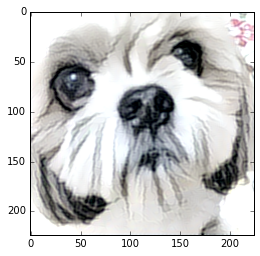

436: 0.7813547849655151, (-0.22867371141910553 - 1.28683340549469)
437: 0.7810479402542114, (-0.22867494821548462 - 1.288555383682251)
438: 0.7807076573371887, (-0.22856706380844116 - 1.2888026237487793)
439: 0.780409574508667, (-0.22812215983867645 - 1.2881821393966675)
440: 0.7800859808921814, (-0.2273881435394287 - 1.2866053581237793)
441: 0.7798008918762207, (-0.2265165150165558 - 1.287702202796936)
442: 0.7794911861419678, (-0.2259385585784912 - 1.2883511781692505)
443: 0.7791827321052551, (-0.22550351917743683 - 1.2889021635055542)
444: 0.7788952589035034, (-0.22516083717346191 - 1.2898313999176025)
445: 0.7785808444023132, (-0.22513757646083832 - 1.290307879447937)
446: 0.77828449010849, (-0.225445955991745 - 1.2901029586791992)
447: 0.777991771697998, (-0.22582031786441803 - 1.289864182472229)
448: 0.7776881456375122, (-0.22600995004177094 - 1.2894487380981445)
449: 0.7774235010147095, (-0.22606150805950165 - 1.288965106010437)
450: 0.7771410346031189, (-0.22638943791389465 - 1

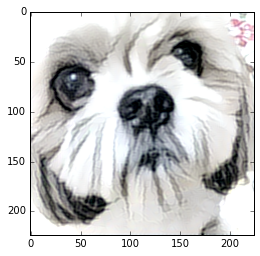

451: 0.7768703699111938, (-0.2270074486732483 - 1.2877289056777954)
452: 0.7766076922416687, (-0.22760681807994843 - 1.2869867086410522)
453: 0.7763462066650391, (-0.22810696065425873 - 1.2860909700393677)
454: 0.7760814428329468, (-0.2282717376947403 - 1.2852783203125)
455: 0.7758382558822632, (-0.2281307578086853 - 1.284719467163086)
456: 0.7755743265151978, (-0.22783386707305908 - 1.2842543125152588)
457: 0.7753497362136841, (-0.22756458818912506 - 1.2840442657470703)
458: 0.7751032114028931, (-0.2272227257490158 - 1.283964991569519)
459: 0.7748723030090332, (-0.22698204219341278 - 1.283469796180725)
460: 0.7746330499649048, (-0.22696782648563385 - 1.282933235168457)
461: 0.7743952870368958, (-0.22752103209495544 - 1.282132625579834)
462: 0.7741413712501526, (-0.22823277115821838 - 1.2817631959915161)
463: 0.7739270925521851, (-0.22883853316307068 - 1.2817925214767456)
464: 0.7736786603927612, (-0.22949445247650146 - 1.2818865776062012)
465: 0.7734625339508057, (-0.23026706278324127

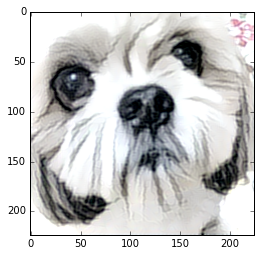

466: 0.7732223272323608, (-0.23114290833473206 - 1.2817786931991577)
467: 0.7729814052581787, (-0.23231731355190277 - 1.2809221744537354)
468: 0.7727553844451904, (-0.23365558683872223 - 1.2800766229629517)
469: 0.7725184559822083, (-0.23456932604312897 - 1.2796486616134644)
470: 0.7723124027252197, (-0.23487791419029236 - 1.2797245979309082)
471: 0.7720749378204346, (-0.23481449484825134 - 1.2802423238754272)
472: 0.7718793749809265, (-0.23469991981983185 - 1.2806402444839478)
473: 0.7716501355171204, (-0.23451629281044006 - 1.2805492877960205)
474: 0.7714312076568604, (-0.23417572677135468 - 1.2800768613815308)
475: 0.7712308168411255, (-0.23343080282211304 - 1.279921054840088)
476: 0.7709953188896179, (-0.2326805740594864 - 1.2799830436706543)
477: 0.7708145976066589, (-0.23225729167461395 - 1.2796945571899414)
478: 0.7706003189086914, (-0.23165865242481232 - 1.2794948816299438)
479: 0.7703923583030701, (-0.23114727437496185 - 1.2791484594345093)
480: 0.7702084183692932, (-0.2304222

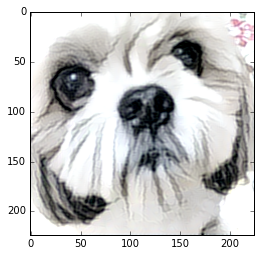

481: 0.769999623298645, (-0.2292042076587677 - 1.2787281274795532)
482: 0.7698078751564026, (-0.2280774712562561 - 1.2783489227294922)
483: 0.769605278968811, (-0.22719599306583405 - 1.2780083417892456)
484: 0.7694151401519775, (-0.22661934792995453 - 1.2777976989746094)
485: 0.7692174315452576, (-0.2266397476196289 - 1.2772905826568604)
486: 0.7690123319625854, (-0.2268129587173462 - 1.2765204906463623)
487: 0.7688297629356384, (-0.2269941121339798 - 1.2760388851165771)
488: 0.768630862236023, (-0.22698874771595 - 1.2763595581054688)
489: 0.7684430480003357, (-0.2269851118326187 - 1.2769880294799805)
490: 0.768257737159729, (-0.22723472118377686 - 1.2773772478103638)
491: 0.7680635452270508, (-0.22757108509540558 - 1.277463436126709)
492: 0.7678699493408203, (-0.22754502296447754 - 1.2770040035247803)
493: 0.7676842212677002, (-0.22729377448558807 - 1.276185393333435)
494: 0.767498254776001, (-0.22673442959785461 - 1.2756767272949219)
495: 0.7672947645187378, (-0.22597350180149078 - 1

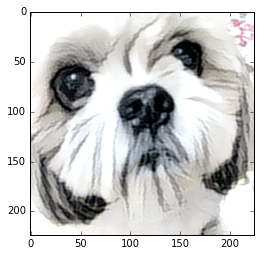

496: 0.7671210765838623, (-0.22543182969093323 - 1.2760206460952759)
497: 0.766930341720581, (-0.22492867708206177 - 1.275538682937622)
498: 0.7667677402496338, (-0.2244468331336975 - 1.2745633125305176)
499: 0.7665774822235107, (-0.22385112941265106 - 1.2738345861434937)
500: 0.7663962841033936, (-0.22307471930980682 - 1.2738174200057983)
501: 0.7662219405174255, (-0.2222718447446823 - 1.2743555307388306)
502: 0.7660462856292725, (-0.2215200662612915 - 1.2747430801391602)
503: 0.7658644914627075, (-0.2209378480911255 - 1.2746055126190186)
504: 0.7657100558280945, (-0.2206076830625534 - 1.2739782333374023)
505: 0.7655172944068909, (-0.22068257629871368 - 1.2726876735687256)
506: 0.7653913497924805, (-0.22093510627746582 - 1.2714022397994995)
507: 0.7651915550231934, (-0.22118869423866272 - 1.2703086137771606)
508: 0.7650362253189087, (-0.2214854508638382 - 1.2696945667266846)
509: 0.7648495435714722, (-0.22133706510066986 - 1.2701412439346313)
510: 0.7647024393081665, (-0.2212574779987

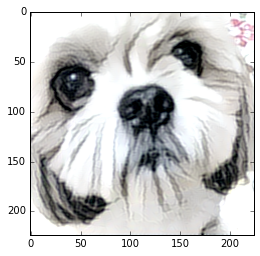

511: 0.7645086646080017, (-0.22130823135375977 - 1.2719299793243408)
512: 0.7643447518348694, (-0.22141215205192566 - 1.2721731662750244)
513: 0.7642041444778442, (-0.22134371101856232 - 1.2722206115722656)
514: 0.7640223503112793, (-0.22099366784095764 - 1.2720086574554443)
515: 0.7638823986053467, (-0.22083379328250885 - 1.271346092224121)
516: 0.7637096047401428, (-0.22076475620269775 - 1.2709447145462036)
517: 0.76356440782547, (-0.22039926052093506 - 1.270677924156189)
518: 0.7634074687957764, (-0.22003702819347382 - 1.2706164121627808)
519: 0.7632465362548828, (-0.21959932148456573 - 1.2706588506698608)
520: 0.763114869594574, (-0.219175323843956 - 1.2701170444488525)
521: 0.7629501819610596, (-0.21869561076164246 - 1.2693593502044678)
522: 0.7628171443939209, (-0.2182447910308838 - 1.2685778141021729)
523: 0.7626676559448242, (-0.21797142922878265 - 1.2680178880691528)
524: 0.762534499168396, (-0.2177049070596695 - 1.267443060874939)
525: 0.7623909711837769, (-0.2174207866191864

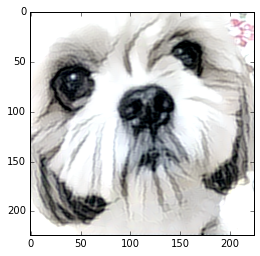

526: 0.7622437477111816, (-0.2185191959142685 - 1.2674669027328491)
527: 0.762106716632843, (-0.2199172079563141 - 1.26787269115448)
528: 0.7619597911834717, (-0.22039657831192017 - 1.267728567123413)
529: 0.7618458271026611, (-0.22024735808372498 - 1.2674006223678589)
530: 0.7617067694664001, (-0.2200833261013031 - 1.267628788948059)
531: 0.7615917325019836, (-0.21936048567295074 - 1.2685279846191406)
532: 0.7614448070526123, (-0.21948759257793427 - 1.269245982170105)
533: 0.7613415718078613, (-0.21985603868961334 - 1.269266963005066)
534: 0.7612054347991943, (-0.22101953625679016 - 1.2692320346832275)
535: 0.7610639333724976, (-0.22197023034095764 - 1.269561767578125)
536: 0.7609294652938843, (-0.2226373255252838 - 1.2703040838241577)
537: 0.7608122825622559, (-0.22217267751693726 - 1.2704774141311646)
538: 0.7606897354125977, (-0.2224743664264679 - 1.2701054811477661)
539: 0.760539174079895, (-0.22384527325630188 - 1.2699761390686035)
540: 0.7604451179504395, (-0.22494187951087952 -

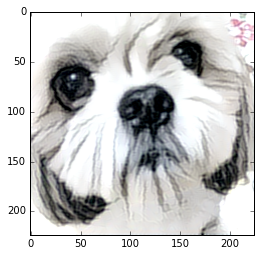

541: 0.7602987885475159, (-0.22484689950942993 - 1.2695591449737549)
542: 0.760182797908783, (-0.2249440848827362 - 1.2698339223861694)
543: 0.7600280046463013, (-0.22547580301761627 - 1.2703148126602173)
544: 0.7599445581436157, (-0.22638316452503204 - 1.270323395729065)
545: 0.7598020434379578, (-0.22773370146751404 - 1.2699557542800903)
546: 0.7596890926361084, (-0.2281903773546219 - 1.269447922706604)
547: 0.7595889568328857, (-0.22825467586517334 - 1.2691420316696167)
548: 0.7594610452651978, (-0.22821339964866638 - 1.268960952758789)
549: 0.7593461275100708, (-0.22884579002857208 - 1.2688651084899902)
550: 0.7592415809631348, (-0.23029331862926483 - 1.268890142440796)
551: 0.7591227293014526, (-0.231745183467865 - 1.26884126663208)
552: 0.7590101957321167, (-0.23177549242973328 - 1.2690393924713135)
553: 0.7589160799980164, (-0.23103074729442596 - 1.269195318222046)
554: 0.7588132619857788, (-0.22947721183300018 - 1.2692011594772339)
555: 0.7587029933929443, (-0.2284756302833557 

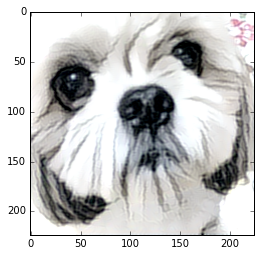

556: 0.7586113214492798, (-0.22828392684459686 - 1.269040584564209)
557: 0.7585142850875854, (-0.22899191081523895 - 1.269241213798523)
558: 0.7583995461463928, (-0.22995568811893463 - 1.267589807510376)
559: 0.7583117485046387, (-0.230481818318367 - 1.2667253017425537)
560: 0.7582241296768188, (-0.2304055243730545 - 1.2665817737579346)
561: 0.7581148147583008, (-0.22978702187538147 - 1.2658125162124634)
562: 0.7580242156982422, (-0.22974611818790436 - 1.2654138803482056)
563: 0.7579379081726074, (-0.2295277863740921 - 1.2656172513961792)
564: 0.7578312158584595, (-0.22983318567276 - 1.2658329010009766)
565: 0.757747232913971, (-0.23086363077163696 - 1.2657266855239868)
566: 0.7576531171798706, (-0.23088720440864563 - 1.2658849954605103)
567: 0.7575689554214478, (-0.23065607249736786 - 1.265170693397522)
568: 0.7574915289878845, (-0.23023968935012817 - 1.2658751010894775)
569: 0.7573966979980469, (-0.23029425740242004 - 1.2667927742004395)
570: 0.7573137283325195, (-0.23020213842391968

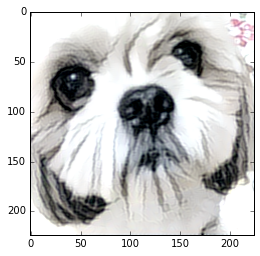

571: 0.7572317123413086, (-0.22956688702106476 - 1.2695598602294922)
572: 0.7571377158164978, (-0.22939206659793854 - 1.268032193183899)
573: 0.7570652961730957, (-0.23014841973781586 - 1.2665143013000488)
574: 0.756976842880249, (-0.23153550922870636 - 1.2654368877410889)
575: 0.756904661655426, (-0.23245413601398468 - 1.266815185546875)
576: 0.7568193674087524, (-0.23269541561603546 - 1.268084168434143)
577: 0.7567527294158936, (-0.23192360997200012 - 1.2692660093307495)
578: 0.7566663026809692, (-0.23047000169754028 - 1.267758846282959)
579: 0.7566084861755371, (-0.22892054915428162 - 1.267886757850647)
580: 0.7565300464630127, (-0.2283453792333603 - 1.2685173749923706)
581: 0.7564748525619507, (-0.2290111482143402 - 1.2694278955459595)
582: 0.7563979625701904, (-0.2303083837032318 - 1.2694053649902344)
583: 0.7563261985778809, (-0.231733500957489 - 1.2681232690811157)
584: 0.7562534809112549, (-0.23254211246967316 - 1.2674144506454468)
585: 0.7561706304550171, (-0.23255136609077454

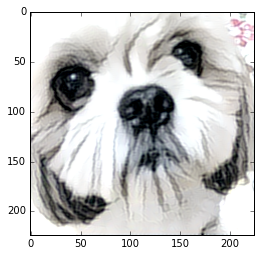

586: 0.7561017870903015, (-0.23195336759090424 - 1.2689423561096191)
587: 0.7560102343559265, (-0.23073844611644745 - 1.268906593322754)
588: 0.7559769153594971, (-0.23056341707706451 - 1.268232822418213)
589: 0.7558667063713074, (-0.23075275123119354 - 1.2683862447738647)
590: 0.7558214664459229, (-0.23150454461574554 - 1.2686105966567993)
591: 0.7557600140571594, (-0.23211689293384552 - 1.2681695222854614)
592: 0.755691647529602, (-0.23164790868759155 - 1.2679518461227417)
593: 0.7556312680244446, (-0.231501966714859 - 1.2682489156723022)
594: 0.7555589079856873, (-0.23200027644634247 - 1.2692981958389282)
595: 0.7555123567581177, (-0.23225218057632446 - 1.2697911262512207)
596: 0.7554451823234558, (-0.23193486034870148 - 1.2697274684906006)
597: 0.7553883194923401, (-0.23138803243637085 - 1.269543170928955)
598: 0.7553250789642334, (-0.23044191300868988 - 1.270060420036316)
599: 0.7552756071090698, (-0.22983059287071228 - 1.2706141471862793)


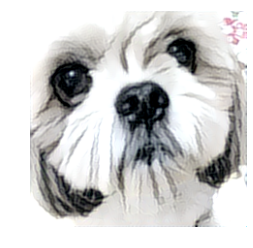

In [54]:
imgs = []
n_iterations = 600

with tf.Session(graph=g) as sess, g.device(device):
    sess.run(tf.initialize_all_variables())
    
    og_img = net_input.eval()
    
    for it_i in range(n_iterations):
        _, this_loss, synth = sess.run([optimizer, loss, net_input], feed_dict={
                'net/dropout_1/random_uniform:0': np.ones(g.get_tensor_by_name(
                    'net/dropout_1/random_uniform:0').get_shape().as_list()),
                'net/dropout/random_uniform:0': np.ones(
                    g.get_tensor_by_name(
                        'net/dropout/random_uniform:0').get_shape().as_list())
            })
        print("{}: {}, ({} - {})".format(it_i, this_loss, 
                                         np.min(synth), np.max(synth)))
        if it_i % 15 == 0:
            m = vgg16.deprocess(synth[0])
            imgs.append(m)
            plt.imshow(m)
            plt.show()
    gif.build_gif(imgs, saveto='stylenet.gif')

In [55]:
ipyd.Image(url='stylenet.gif?i={}'.format(np.random.rand()), height=300, width=300)

In [54]:
utils.build_submission('session-4.zip', ('softmax.gif',
                                         'fractal.gif',
                                         'guided.gif',
                                         'content.png',
                                         'style.png',
                                         'stylenet.gif'))

Your assignment zip file has been created!
Now submit the file:
/Users/km/Dropbox/notebooks/kadenze/CADL/session-4/session-4.zip
to Kadenze for grading!
